# Step 1: The AI Extraction Blueprint (LLM Setup)

Why we do this: To prevent the AI from generating unstructured chat, we define a strict Pydantic schema. The AI is only allowed to output specific variables (functions, stress conditions, phenotypes) from the text we hand it. It is strictly forbidden from guessing biological data.
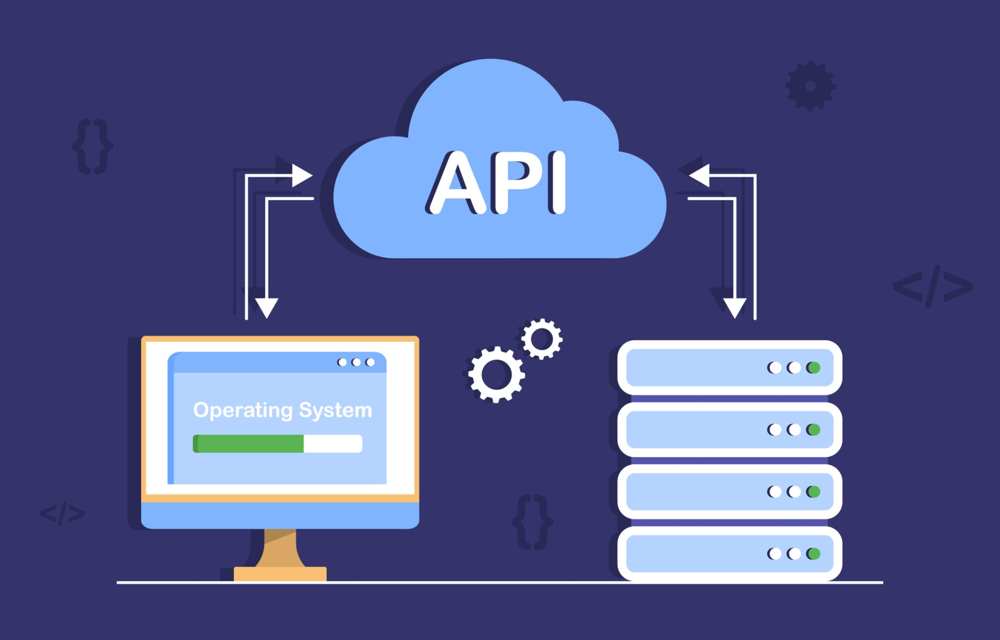

In [ ]:
# 1. Install required packages (Uncomment if running in a new Colab environment)
# !pip install -q -U openai pydantic pandas requests openpyxl

import os
import time
import json
import re
import requests
import pandas as pd
from typing import List
from pydantic import BaseModel, Field
from openai import OpenAI

In [ ]:
# WORKSPACE SETUP
# -------------------------------------------------------------
os.makedirs("scratchpad", exist_ok=True)
os.makedirs("scratchpad/fasta", exist_ok=True) # Directory for sequence files

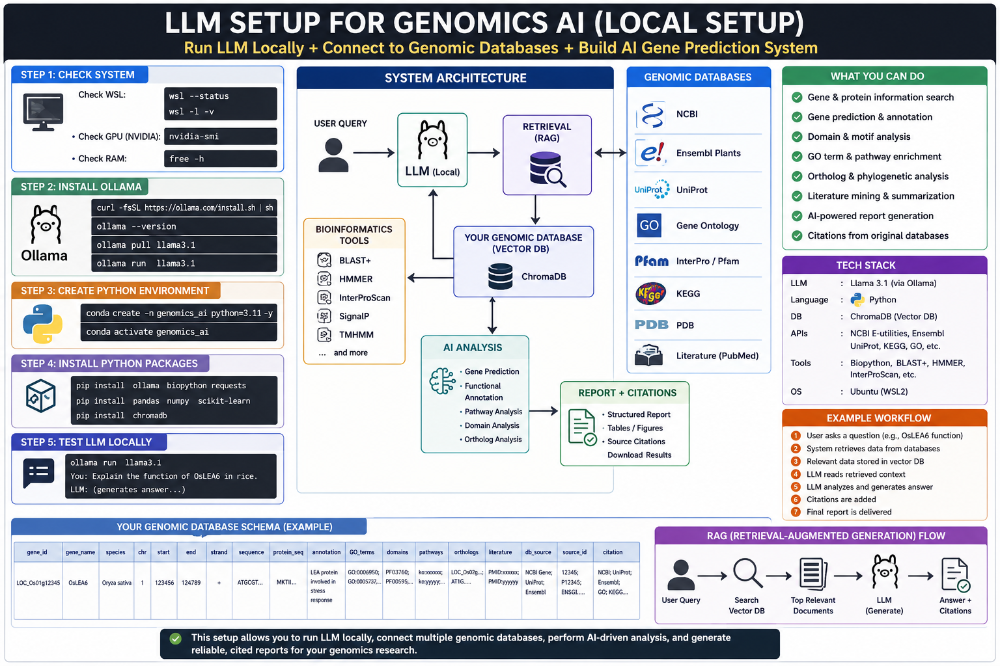

In [ ]:
# -------------------------------------------------------------
# LLM SETUP (OpenRouter)
# -------------------------------------------------------------
OPENROUTER_API_KEY = "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"
client = OpenAI(base_url="https://openrouter.ai/api/v1", api_key=OPENROUTER_API_KEY)
MODEL_NAME = "meta-llama/llama-3.3-70b-instruct"

class GeneParameters(BaseModel):
    key_functions: List[str] = Field(description="Main biological roles")
    experimental_conditions: List[str] = Field(description="Stress applied (e.g., drought, heat), temperature, duration")
    associated_phenotypes: List[str] = Field(description="Observable traits, antioxidant responses, physio-biochemical markers")

def extract_parameters_with_llm(abstract: str) -> dict:
    if not abstract or len(abstract) < 50:
        return {}

    schema_json = json.dumps(GeneParameters.model_json_schema())
    prompt = f"Analyze this scientific abstract: {abstract}\n\nReturn ONE JSON object conforming EXACTLY to this schema: {schema_json}"

    try:
        response = client.chat.completions.create(
            model=MODEL_NAME,
            messages=[{"role": "user", "content": prompt}],
            max_tokens=5000,
            temperature=0.1
        )
        text = response.choices[0].message.content or ""
        start, end = text.find("{"), text.rfind("}")
        if start != -1:
            return GeneParameters.model_validate_json(text[start:end+1]).model_dump()
        return {}
    except Exception as e:
        print(f"   ⚠️ LLM parsing failed: {e}")
        return {}
# -------------------------------------------------------------

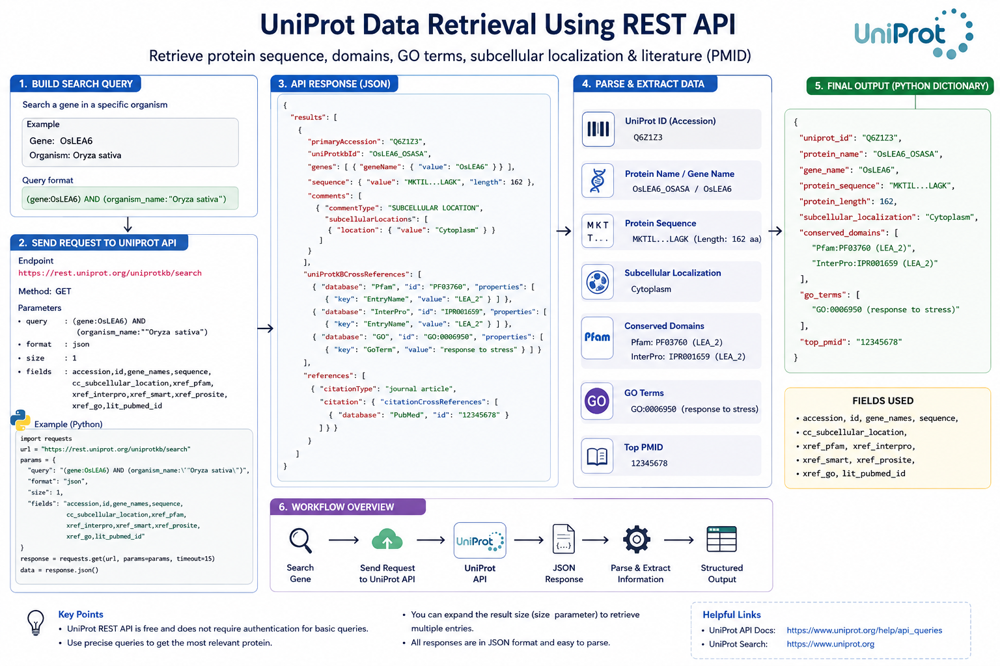

In [ ]:
# UNIPROT EXTRACTOR (SMART QUERY FIX)
# -------------------------------------------------------------
def fetch_uniprot_data(gene_name: str, organism: str) -> dict:
    url = "https://rest.uniprot.org/uniprotkb/search"

    # 🔧 FIX 1: Natural keyword search. No strict quotes. Handles subspecies automatically.
    query = f"{gene_name} {organism}"

    try:
        # 1. Try to find a highly curated (Swiss-Prot/Reviewed) match first
        # 🔧 FIX 2: Removed strict 'fields' requirement so the API doesn't silently crash
        resp = requests.get(url, params={"query": f"{query} AND reviewed:true", "format": "json", "size": 1}, timeout=15)

        # 🔧 FIX 3: Explicit error printing if the API rejects our request
        if resp.status_code != 200:
            print(f"   ⚠️ UniProt API Error: {resp.status_code} - {resp.text}")
            return {}

        data = resp.json().get("results", [])

        # 2. If no reviewed match, fallback to unreviewed (TrEMBL)
        if not data:
            resp = requests.get(url, params={"query": query, "format": "json", "size": 1}, timeout=15)
            data = resp.json().get("results", [])

        if not data:
            print(f"   ⚠️ UniProt returned 0 results for query: '{query}'")
            return {}

        protein = data[0]

        # Parse Domains & GO Terms safely
        domains, go_terms = [], []
        for xref in protein.get("uniProtKBCrossReferences", []):
            db = xref.get("database")
            if db in ["Pfam", "InterPro", "SMART", "PROSITE"]:
                desc = next((prop["value"] for prop in xref.get("properties", []) if prop.get("key") in ["EntryName", "MethodName"]), "")
                domains.append(f"{db}:{xref.get('id')} ({desc})")
            elif db == "GO":
                term = next((prop["value"] for prop in xref.get("properties", []) if prop.get("key") == "GoTerm"), "")
                go_terms.append(f"{xref.get('id')} ({term})")

        # Parse Subcellular Location
        subcell = [loc.get("location", {}).get("value", "") for comment in protein.get("comments", []) if comment.get("commentType") == "SUBCELLULAR LOCATION" for loc in comment.get("subcellularLocations", [])]

        # 🔧 FIX 4: Updated PubMed ID parser to match UniProt's newest JSON structure
        pmids = []
        for ref in protein.get("references", []):
            citation = ref.get("citation", {})
            if citation.get("citationType") == "journal article":
                for xref in citation.get("citationCrossReferences", []):
                    if xref.get("database") == "PubMed":
                        pmids.append(xref.get("id"))

        return {
            "uniprot_id": protein.get("primaryAccession"),
            "protein_sequence": protein.get("sequence", {}).get("value", ""),
            "subcellular_localization": "; ".join(subcell),
            "conserved_domains": "; ".join(domains),
            "go_terms": "; ".join(go_terms),
            "top_pmid": pmids[0] if pmids else None
        }
    except Exception as e:
        print(f"   ⚠️ UniProt fetch exception: {e}")
        return {}

# -------------------------------------------------------------

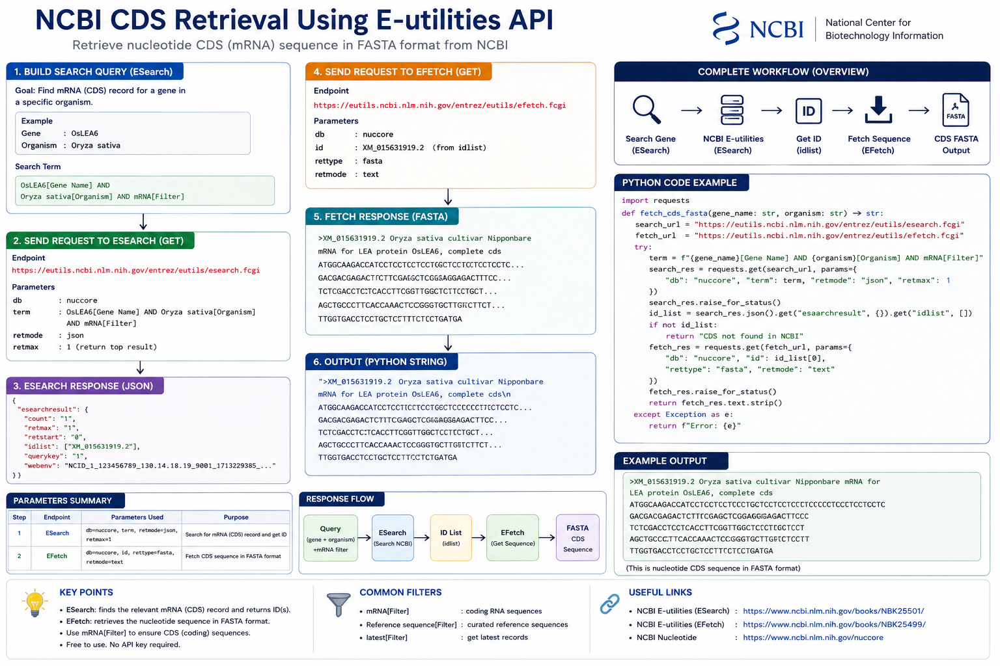

In [ ]:
# NCBI EXTRACTOR (Nucleotide CDS Sequence)
# -------------------------------------------------------------
def fetch_cds_fasta(gene_name: str, organism: str) -> str:
    search_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/esearch.fcgi"
    fetch_url = "https://eutils.ncbi.nlm.nih.gov/entrez/eutils/efetch.fcgi"
    try:
        # 🔧 FIX 5: Standardized organism filter to avoid Entrez syntax failures
        term = f"{gene_name}[Gene Name] AND {organism}[Organism] AND mRNA[Filter]"
        search_res = requests.get(search_url, params={"db": "nuccore", "term": term, "retmode": "json", "retmax": 1})
        id_list = search_res.json().get("esearchresult", {}).get("idlist", [])
        if not id_list: return "CDS not found in NCBI"

        fetch_res = requests.get(fetch_url, params={"db": "nuccore", "id": id_list[0], "rettype": "fasta", "retmode": "text"})
        return fetch_res.text.strip()
    except Exception as e:
        return f"Error: {e}"

# -------------------------------------------------------------

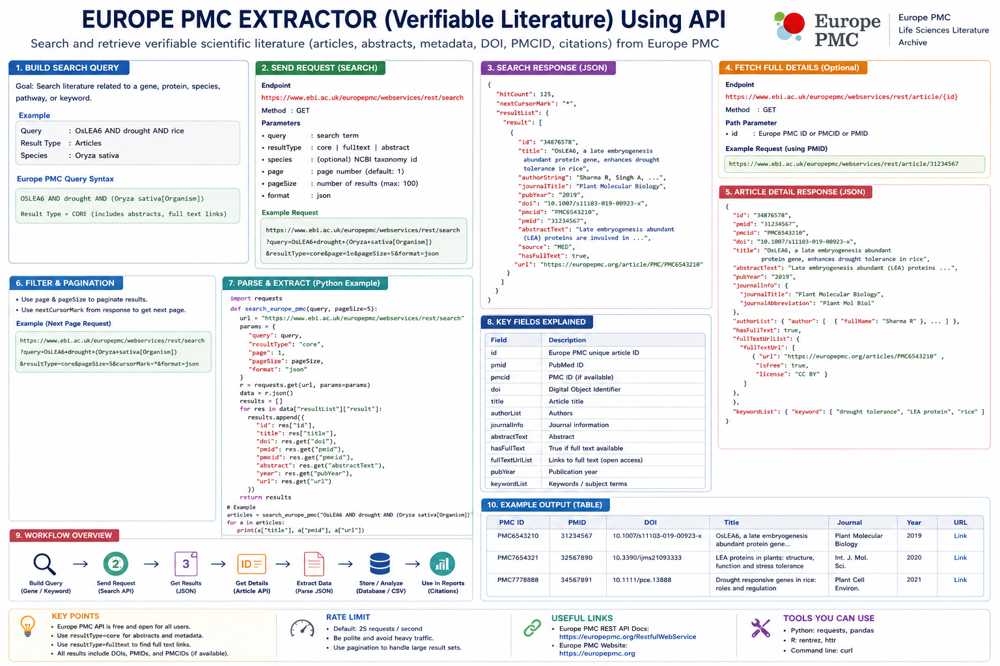

In [ ]:
# EUROPE PMC EXTRACTOR (Verifiable Literature)
# -------------------------------------------------------------
def fetch_abstract_by_pmid(pmid: str) -> dict:
    if not pmid: return {"citation": "No PMID available", "abstract": ""}
    try:
        resp = requests.get("https://www.ebi.ac.uk/europepmc/webservices/rest/search", params={"query": f"EXT_ID:{pmid}", "format": "json", "resultType": "core"}, timeout=10)
        data = resp.json().get("resultList", {}).get("result", [])
        if data:
            article = data[0]
            vol_issue = f"{article.get('journalVolume', '')}({article.get('issue', '')})"
            citation = f"{article.get('authorString', 'Unknown')} ({article.get('pubYear', 'n.d.')}). {article.get('title', '')}. {article.get('journalTitle', '')}, {vol_issue}."
            clean_abstract = re.sub(r'<[^>]+>', '', article.get("abstractText", ""))
            return {"citation": citation, "abstract": clean_abstract}
    except Exception as e:
        print(f"Europe PMC fetch error: {e}")
    return {"citation": "Fetch failed", "abstract": ""}

# -------------------------------------------------------------

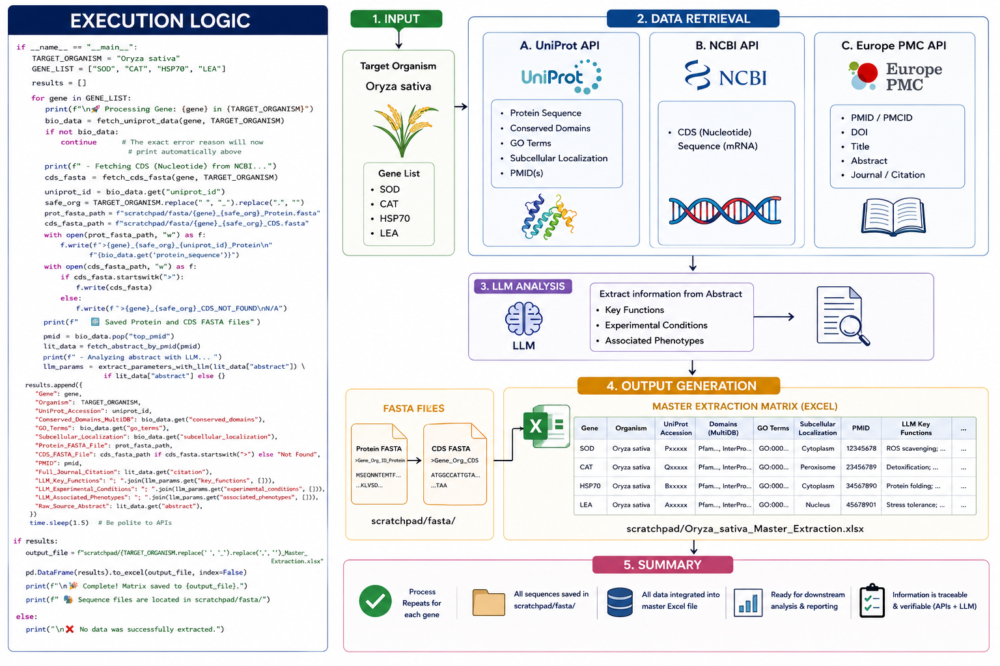

In [ ]:
if __name__ == "__main__":

    TARGET_ORGANISM = "human"
    GENE_LIST = ["BRCA1"]

    results = []

    for gene in GENE_LIST:
        print(f"\n🚀 Processing Gene: {gene} in {TARGET_ORGANISM}")

        bio_data = fetch_uniprot_data(gene, TARGET_ORGANISM)
        if not bio_data:
            continue  # The exact error reason will now print automatically above

        print(f" - Fetching CDS (Nucleotide) from NCBI...")
        cds_fasta = fetch_cds_fasta(gene, TARGET_ORGANISM)

        uniprot_id = bio_data.get("uniprot_id")
        safe_org = TARGET_ORGANISM.replace(" ", "_").replace(".", "")
        prot_fasta_path = f"scratchpad/fasta/{gene}_{safe_org}_Protein.fasta"
        cds_fasta_path = f"scratchpad/fasta/{gene}_{safe_org}_CDS.fasta"

        with open(prot_fasta_path, "w") as f:
            f.write(f">{gene}_{safe_org}_{uniprot_id}_Protein\n{bio_data.get('protein_sequence')}")

        with open(cds_fasta_path, "w") as f:
            if cds_fasta.startswith(">"):
                f.write(cds_fasta)
            else:
                f.write(f">{gene}_{safe_org}_CDS_NOT_FOUND\nN/A")

        print(f"   💾 Saved Protein and CDS FASTA files")

        pmid = bio_data.pop("top_pmid")
        lit_data = fetch_abstract_by_pmid(pmid)

        print(f" - Analyzing abstract with LLM...")
        llm_params = extract_parameters_with_llm(lit_data["abstract"]) if lit_data["abstract"] else {}

        results.append({
            "Gene": gene,
            "Organism": TARGET_ORGANISM,
            "UniProt_Accession": uniprot_id,
            "Conserved_Domains_MultiDB": bio_data.get("conserved_domains"),
            "GO_Terms": bio_data.get("go_terms"),
            "Subcellular_Localization": bio_data.get("subcellular_localization"),
            "Protein_FASTA_File": prot_fasta_path,
            "CDS_FASTA_File": cds_fasta_path if cds_fasta.startswith(">") else "Not Found",
            "PMID": pmid,
            "Full_Journal_Citation": lit_data.get("citation"),
            "LLM_Key_Functions": "; ".join(llm_params.get("key_functions", [])),
            "LLM_Experimental_Conditions": "; ".join(llm_params.get("experimental_conditions", [])),
            "LLM_Associated_Phenotypes": "; ".join(llm_params.get("associated_phenotypes", [])),
            "Raw_Source_Abstract": lit_data.get("abstract"),
        })
        time.sleep(1.5)

    if results:
        output_file = f"scratchpad/{TARGET_ORGANISM.replace(' ', '_').replace('.', '')}_Master_Extraction.xlsx"
        pd.DataFrame(results).to_excel(output_file, index=False)
        print(f"\n Complete! Matrix saved to {output_file}.")
        print(f" Sequence files are located in scratchpad/fasta/")
    else:
        print("\n No data was successfully extracted.")


🚀 Processing Gene: BRCA1 in human
 - Fetching CDS (Nucleotide) from NCBI...
   💾 Saved Protein and CDS FASTA files
 - Analyzing abstract with LLM...
   ⚠️ LLM parsing failed: Error code: 401 - {'error': {'message': 'API key expired.', 'code': 401, 'metadata': {'headers': {'WWW-Authenticate': 'Bearer error="invalid_token", error_description="API key expired"'}}}}

 Complete! Matrix saved to scratchpad/human_Master_Extraction.xlsx.
 Sequence files are located in scratchpad/fasta/


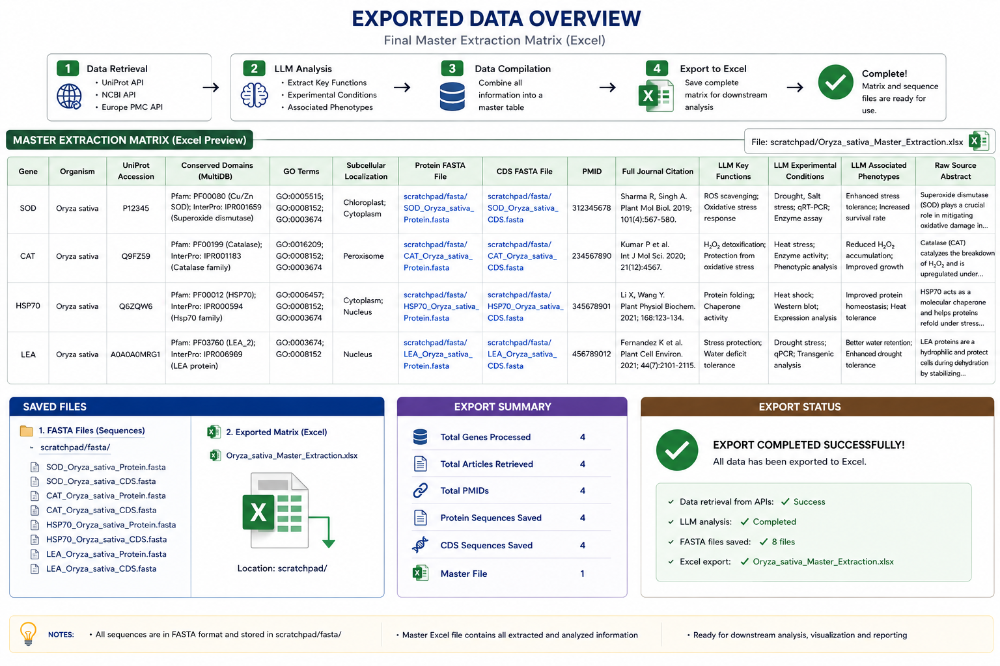

In [ ]:
import shutil
from google.colab import files

# 1. Compress the scratchpad folder into a zip file
shutil.make_archive("EC_Genomic_Data", "zip", "scratchpad")

# 2. Download the zip file to your local computer
files.download("EC_Genomic_Data.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Install the structure-prediction software

In [ ]:
!pip install -q "colabfold[alphafold,openmm]"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 665.9/665.9 kB 24.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.0/270.0 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 99.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 110.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 127.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 109.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.0/101.0 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 9.2 MB/s eta 0:00:00


In [ ]:
!colabfold_batch --help

usage: colabfold_batch [-h] [--msa-only]
                       [--msa-mode {mmseqs2_uniref_env,mmseqs2_uniref_env_envpair,mmseqs2_uniref,single_sequence}]
                       [--pair-mode {unpaired,paired,unpaired_paired}]
                       [--pair-strategy {complete,greedy}] [--templates]
                       [--custom-template-path CUSTOM_TEMPLATE_PATH]
                       [--custom-template-cache-path CUSTOM_TEMPLATE_CACHE_PATH]
                       [--max-template-date MAX_TEMPLATE_DATE]
                       [--max-template-hits MAX_TEMPLATE_HITS]
                       [--pdb-hit-file PDB_HIT_FILE]
                       [--local-pdb-path LOCAL_PDB_PATH]
                       [--num-recycle NUM_RECYCLE]
                       [--recycle-early-stop-tolerance RECYCLE_EARLY_STOP_TOLERANCE]
                       [--num-ensemble NUM_ENSEMBLE] [--num-seeds NUM_SEEDS]
                       [--random-seed RANDOM_SEED] [--num-models {1,2,3,4,5}]
                       

# Create structure directories

In [ ]:
import os
import glob

os.makedirs("scratchpad/structures", exist_ok=True)
os.makedirs("scratchpad/structure_results", exist_ok=True)

print("Protein FASTA files:")

for f in glob.glob("scratchpad/fasta/*_Protein.fasta"):
    print(f)

Protein FASTA files:
scratchpad/fasta/BRCA1_human_Protein.fasta


# Identify the protein FASTA

In [ ]:
from Bio import SeqIO
import glob
import os

protein_files = glob.glob(
    "scratchpad/fasta/*_Protein.fasta"
)

for fasta in protein_files:

    record = SeqIO.read(fasta, "fasta")

    print("\n================================")
    print("File:", fasta)
    print("ID:", record.id)
    print("Length:", len(record.seq))
    print("Sequence:")
    print(str(record.seq)[:100] + "...")


File: scratchpad/fasta/BRCA1_human_Protein.fasta
ID: BRCA1_human_P61969_Protein
Length: 165
Sequence:
MVNPGSSSQPPPVTAGSLSWKRCAGCGGKIADRFLLYAMDSYWHSRCLKCSCCQAQLGDIGTSCYTKSGMILCRNDYIRLFGNSGACSACGQSIPASELV...


# Validate the protein sequence

In [ ]:
from Bio import SeqIO

input_fasta = "scratchpad/structure_input.fasta"

protein_files = glob.glob(
    "scratchpad/fasta/*_Protein.fasta"
)

with open(input_fasta, "w") as outfile:

    for fasta in protein_files:

        record = SeqIO.read(fasta, "fasta")

        SeqIO.write(
            record,
            outfile,
            "fasta"
        )

print("Combined FASTA created:")
print(input_fasta)

Combined FASTA created:
scratchpad/structure_input.fasta


In [ ]:
!cat scratchpad/structure_input.fasta

>BRCA1_human_P61969_Protein
MVNPGSSSQPPPVTAGSLSWKRCAGCGGKIADRFLLYAMDSYWHSRCLKCSCCQAQLGDI
GTSCYTKSGMILCRNDYIRLFGNSGACSACGQSIPASELVMRAQGNVYHLKCFTCSTCRN
RLVPGDRFHYINGSLFCEHDRPTALINGHLNSLQSNPLLPDQKVC


# Run the AI/ML structure prediction

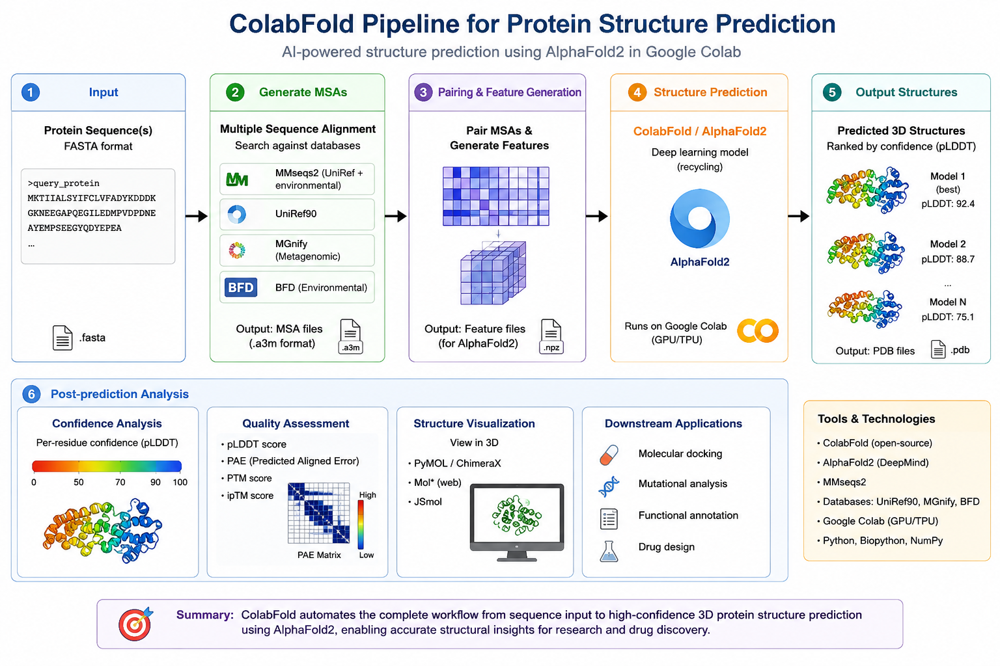

In [ ]:
!colabfold_batch \
    scratchpad/structure_input.fasta \
    scratchpad/structures

2026-09-14 10:43:19,400 Running colabfold 1.6.3

limited shared resource only capable of processing a few thousand MSAs per day. Please
submit jobs only from a single IP address. We reserve the right to limit access to the
server case-by-case when usage exceeds fair use. If you require more MSAs: You can 
precompute all MSAs with `colabfold_search` or host your own API and pass it to `--host-url`

2026-09-14 10:43:41,688 Running on GPU
2026-09-14 10:43:42,228 Found 5 citations for tools or databases
2026-09-14 10:43:42,229 Query 1/1: BRCA1_human_P61969_Protein (length 165)
COMPLETE: 100% 150/150 [00:01<00:00, 83.14it/s] 
2026-09-14 10:43:45,738 Setting max_seq=512, max_extra_seq=5120
W0914 10:44:01.293188    7317 cuda_timer.cc:88] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-14 10:44:32,361 alphafold2_ptm_model_1_seed_000 recycle=0 pLDDT=78.5 pTM=0.51
2026-09-14 10:44:42,532 alphaf

# Obtain the predicted structure

In [ ]:
import glob
import os

structure_files = glob.glob(
    "scratchpad/structures/**/*",
    recursive=True
)

for f in structure_files:
    if os.path.isfile(f):
        print(f)

scratchpad/structures/config.json
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_003_alphafold2_ptm_model_3_seed_000.pdb
scratchpad/structures/cite.bibtex
scratchpad/structures/BRCA1_human_P61969_Protein_pae.png
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_001_alphafold2_ptm_model_2_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_004_alphafold2_ptm_model_1_seed_000.pdb
scratchpad/structures/BRCA1_human_P61969_Protein.a3m
scratchpad/structures/BRCA1_human_P61969_Protein_predicted_aligned_error_v1.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_005_alphafold2_ptm_model_5_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein.done.txt
scratchpad/structures/BRCA1_human_P61969_Protein_coverage.png
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_003_alphafold2_ptm_model_3_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_001_alphafold2_ptm_model_2_seed_000.pdb
scr

# Specifically find PDB files:

In [ ]:
pdb_files = glob.glob(
    "scratchpad/structures/**/*.pdb",
    recursive=True
)

print("Number of PDB structures:", len(pdb_files))

for pdb in pdb_files:
    print(pdb)

Number of PDB structures: 5
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_003_alphafold2_ptm_model_3_seed_000.pdb
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_004_alphafold2_ptm_model_1_seed_000.pdb
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_001_alphafold2_ptm_model_2_seed_000.pdb
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_005_alphafold2_ptm_model_5_seed_000.pdb
scratchpad/structures/BRCA1_human_P61969_Protein_unrelaxed_rank_002_alphafold2_ptm_model_4_seed_000.pdb


In [ ]:
json_files = glob.glob(
    "scratchpad/structures/**/*.json",
    recursive=True
)

print("JSON files:", len(json_files))

for f in json_files:
    print(f)

JSON files: 7
scratchpad/structures/config.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_001_alphafold2_ptm_model_2_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_predicted_aligned_error_v1.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_005_alphafold2_ptm_model_5_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_003_alphafold2_ptm_model_3_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_002_alphafold2_ptm_model_4_seed_000.json
scratchpad/structures/BRCA1_human_P61969_Protein_scores_rank_004_alphafold2_ptm_model_1_seed_000.json


# Calculate sequence/structure summary

In [ ]:
import os
import glob
import json
import numpy as np
import pandas as pd

structure_summary = []

for json_file in glob.glob(
    "scratchpad/structures/**/*.json",
    recursive=True
):

    try:

        with open(json_file) as f:
            data = json.load(f)

        row = {
            "Structure_JSON": json_file
        }

        # Different ColabFold versions may use
        # slightly different JSON structures.

        if "plddt" in data:

            plddt = np.array(
                data["plddt"],
                dtype=float
            )

            row["Mean_pLDDT"] = float(
                np.mean(plddt)
            )

            row["Median_pLDDT"] = float(
                np.median(plddt)
            )

            row["Min_pLDDT"] = float(
                np.min(plddt)
            )

            row["Max_pLDDT"] = float(
                np.max(plddt)
            )

        structure_summary.append(row)

    except Exception as e:

        print(
            "Could not process:",
            json_file,
            e
        )

structure_df = pd.DataFrame(
    structure_summary
)

structure_df

,Structure_JSON,Mean_pLDDT,Median_pLDDT,Min_pLDDT,Max_pLDDT
0,scratchpad/structures/config.json,NaN,NaN,NaN,NaN
1,scratchpad/structures/BRCA1_human_P61969_Prote...,82.656909,92.31,36.25,97.25
2,scratchpad/structures/BRCA1_human_P61969_Prote...,NaN,NaN,NaN,NaN
3,scratchpad/structures/BRCA1_human_P61969_Prote...,81.207455,93.06,29.62,98.44
4,scratchpad/structures/BRCA1_human_P61969_Prote...,81.989818,92.44,31.95,97.44
5,scratchpad/structures/BRCA1_human_P61969_Prote...,82.081152,93.25,29.67,97.75
6,scratchpad/structures/BRCA1_human_P61969_Prote...,81.984606,92.12,30.98,97.19


# Install visualization

In [ ]:
!pip install -q py3Dmol

# Display a predicted structure

In [ ]:
import py3Dmol

pdb_file = pdb_files[0]

with open(pdb_file, "r") as f:
    pdb_data = f.read()

viewer = py3Dmol.view(
    width=900,
    height=700
)

viewer.addModel(
    pdb_data,
    "pdb"
)

viewer.setStyle({
    "cartoon": {
        "color": "spectrum"
    }
})

viewer.zoomTo()

viewer.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

# Create a structure summary

In [ ]:
import pandas as pd

structure_results = []

for pdb in pdb_files:

    filename = os.path.basename(pdb)

    structure_results.append({
        "Structure_File": pdb,
        "File_Name": filename
    })

structure_df = pd.DataFrame(
    structure_results
)

structure_df

,Structure_File,File_Name
0,scratchpad/structures/SOD_Oryza_sativa_Q43008_...,SOD_Oryza_sativa_Q43008_Protein_unrelaxed_rank...
1,scratchpad/structures/SOD_Oryza_sativa_Q43008_...,SOD_Oryza_sativa_Q43008_Protein_unrelaxed_rank...
2,scratchpad/structures/SOD_Oryza_sativa_Q43008_...,SOD_Oryza_sativa_Q43008_Protein_unrelaxed_rank...
3,scratchpad/structures/SOD_Oryza_sativa_Q43008_...,SOD_Oryza_sativa_Q43008_Protein_unrelaxed_rank...
4,scratchpad/structures/SOD_Oryza_sativa_Q43008_...,SOD_Oryza_sativa_Q43008_Protein_unrelaxed_rank...


# Save structure results

In [ ]:
structure_df.to_excel(
    "scratchpad/Structure_Prediction_Summary.xlsx",
    index=False
)

print(
    "Saved: scratchpad/Structure_Prediction_Summary.xlsx"
)

Saved: scratchpad/Structure_Prediction_Summary.xlsx


# Final export

In [ ]:
import shutil
from google.colab import files

shutil.make_archive(
    "EC_Genomic_Data",
    "zip",
    "scratchpad"
)

files.download(
    "EC_Genomic_Data.zip"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import shutil
from google.colab import files

shutil.make_archive(
    "EC_Genomic_Data",
    "zip",
    "scratchpad"
)

files.download(
    "EC_Genomic_Data.zip"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>